In [1]:
import torch
from torch import nn
import pandas as pd
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from PIL import Image
import torchvision
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
from torchvision.utils import save_image
from torchvision import datasets
!pip install torchmetrics
from torchmetrics import Accuracy
!pip install path
from path import Path
try: 
    import torchinfo
except:
    !pip install torchinfo
    import torchinfo
    
from torchinfo import summary

In [5]:
creds = '{"username":"jakegehri","key":"3d0213a52bd1816d21037e941bc77569"}'

In [6]:
cred_path = Path('~/.kaggle/kaggle.json').expanduser()
if not cred_path.exists(): 
    cred_path.parent.mkdir(exist_ok=True) 
    cred_path.write_text(creds) 
    cred_path.chmod(0o600)

In [2]:
train_dir = Path('train')
valid_dir = Path('valid')
test_dir = Path('test')

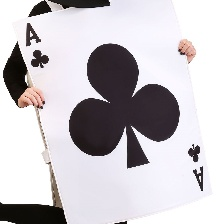

In [3]:
img = (train_dir / 'ace of clubs' / '001.jpg')
img = Image.open(img)
img

In [4]:
img.size

(224, 224)

In [5]:
data_transforms = transforms.Compose([
    transforms.Resize(64),
    transforms.RandomVerticalFlip(0.5),
    transforms.RandomRotation(90),
    transforms.ToTensor()

])


test_transforms = transforms.Compose([
    transforms.Resize(64),
    transforms.ToTensor()
])

In [6]:
train_data = datasets.ImageFolder(root=train_dir,
                                  transform=data_transforms,
                                  target_transform=None)

valid_data = datasets.ImageFolder(root=valid_dir,
                                  transform=data_transforms)

test_data = datasets.ImageFolder(root=test_dir,
                                  transform=test_transforms)

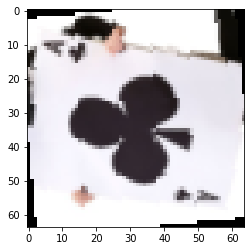

In [7]:
ex = train_data[0][0]
plt.imshow(ex.permute(1, 2, 0))

In [52]:
class_names = train_data.classes

In [9]:
len(train_data.samples)

7518

In [10]:
train_dl = DataLoader(dataset=train_data,
                     batch_size=64,
                     shuffle=True)

valid_dl = DataLoader(dataset=valid_data,
                     batch_size=64,
                     shuffle=False)

test_dl = DataLoader(dataset=test_data,
                     batch_size=64,
                     shuffle=False)

# Small VGG Model

In [11]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

class TinyVGG(nn.Module):
    def __init__(self, input_shape, hidden_units, output_shape):
        super().__init__()
        self.conv_block_1 = nn.Sequential(
            nn.Conv2d(in_channels=input_shape, out_channels=hidden_units, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=hidden_units, out_channels=hidden_units, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        
        self.conv_block_2 = nn.Sequential(
            nn.Conv2d(in_channels=hidden_units, out_channels=hidden_units, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=hidden_units, out_channels=hidden_units, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)   
        )
        
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features=hidden_units*16*16, out_features=output_shape)
        )
        

    def forward(self, x):
        x = self.conv_block_1(x)
        x = self.conv_block_2(x)
        x = self.classifier(x)
        return x

In [12]:
model_0 = TinyVGG(input_shape=3, hidden_units=10, output_shape=len(train_data.classes)).to(device)

In [13]:
model_0

TinyVGG(
  (conv_block_1): Sequential(
    (0): Conv2d(3, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv_block_2): Sequential(
    (0): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=2560, out_features=52, bias=True)
  )
)

In [14]:
summary(model_0, input_size=[1, 3, 64, 64])

Layer (type:depth-idx)                   Output Shape              Param #
TinyVGG                                  [1, 52]                   --
├─Sequential: 1-1                        [1, 10, 32, 32]           --
│    └─Conv2d: 2-1                       [1, 10, 64, 64]           280
│    └─ReLU: 2-2                         [1, 10, 64, 64]           --
│    └─Conv2d: 2-3                       [1, 10, 64, 64]           910
│    └─ReLU: 2-4                         [1, 10, 64, 64]           --
│    └─MaxPool2d: 2-5                    [1, 10, 32, 32]           --
├─Sequential: 1-2                        [1, 10, 16, 16]           --
│    └─Conv2d: 2-6                       [1, 10, 32, 32]           910
│    └─ReLU: 2-7                         [1, 10, 32, 32]           --
│    └─Conv2d: 2-8                       [1, 10, 32, 32]           910
│    └─ReLU: 2-9                         [1, 10, 32, 32]           --
│    └─MaxPool2d: 2-10                   [1, 10, 16, 16]           --
├─Sequentia

In [15]:
img_batch, label_batch = next(iter(train_dl))

img_single, label_single = img_batch[0].unsqueeze(dim=0), label_batch[0]
print(f"Single image shape: {img_single.shape}\n")

model_0.eval()
with torch.inference_mode():
    pred = model_0(img_single.to(device))

print(f"Output logits:\n{pred}\n")
print(f"Output prediction probabilities:\n{torch.softmax(pred, dim=1)}\n")
print(f"Output prediction label:\n{torch.argmax(torch.softmax(pred, dim=1), dim=1)}\n")
print(f"Actual label:\n{label_single}")

Single image shape: torch.Size([1, 3, 64, 64])

Output logits:
tensor([[-0.0280, -0.0261,  0.0380, -0.0245, -0.0023, -0.0061, -0.0346,  0.0206,
          0.0212,  0.0360, -0.0263,  0.0042, -0.0558,  0.0214,  0.0385,  0.0275,
         -0.0160, -0.0569,  0.0222,  0.0187,  0.0538,  0.0149, -0.0417, -0.0173,
          0.0052, -0.0290,  0.0435,  0.0482, -0.0220, -0.0251, -0.0198,  0.0114,
          0.0214, -0.0082, -0.0052,  0.0327, -0.0327,  0.0152, -0.0507,  0.0004,
         -0.0974, -0.0024, -0.0002,  0.0110,  0.0223,  0.0388,  0.0207, -0.0025,
          0.0742,  0.0031, -0.0055, -0.0171]], device='cuda:0')

Output prediction probabilities:
tensor([[0.0187, 0.0187, 0.0200, 0.0188, 0.0192, 0.0191, 0.0186, 0.0196, 0.0196,
         0.0199, 0.0187, 0.0193, 0.0182, 0.0196, 0.0200, 0.0198, 0.0189, 0.0182,
         0.0196, 0.0196, 0.0203, 0.0195, 0.0184, 0.0189, 0.0193, 0.0187, 0.0201,
         0.0202, 0.0188, 0.0187, 0.0188, 0.0194, 0.0196, 0.0191, 0.0191, 0.0199,
         0.0186, 0.0195, 0.01

In [22]:
def train_step(model: torch.nn.Module, 
               dataloader: torch.utils.data.DataLoader, 
               loss_fn: torch.nn.Module, 
               optimizer: torch.optim.Optimizer,
               accuracy):
    
    model.train()
    
    train_loss, train_acc = 0, 0

    for batch, (X, y) in enumerate(dataloader):

        X, y = X.to(device), y.to(device)

        y_pred = model(X)

        loss = loss_fn(y_pred, y)
        train_loss += loss.item() 

        optimizer.zero_grad()

        loss.backward()

        optimizer.step()

        y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
        train_acc += accuracy(y_pred_class, y)

    train_loss /= len(dataloader)
    train_acc /= len(dataloader)
    return train_loss, train_acc

In [23]:
def valid_step(model, dataloader, loss_fn, accuracy):
    
    model.eval()
    
    valid_loss, valid_acc = 0, 0
    
    with torch.no_grad():
        for batch, (X, y) in enumerate(dataloader):
            X, y = X.to(device), y.to(device)

            y_pred = model(X)
            
            valid_loss += loss_fn(y_pred, y)
            
            valid_pred_labels = y_pred.argmax(dim=1)
            
            valid_acc += accuracy(valid_pred_labels, y)
            
    valid_loss /= len(dataloader)
    valid_acc /= len(dataloader)
    
    return valid_loss, valid_acc

In [24]:
def train(model, train_dataloader, valid_dataloader, optimizer, loss_fn, accuracy, epochs = 5):
    
    results = {"train_loss": [],
               "train_accuracy": [],
               "valid_loss": [],
               "valid_accuracy": []
              }
    
    for epoch in range(epochs):
        train_loss, train_acc = train_step(model, train_dataloader, loss_fn, optimizer, accuracy)
        
        valid_loss, valid_acc = valid_step(model, valid_dataloader, loss_fn, accuracy)
        
        print(
            f"Epoch: {epoch+1} | "
            f"train_loss: {train_loss:.4f} | "
            f"train_accuracy: {train_acc:.4f} | "
            f"valid_loss: {valid_loss:.4f} | "
            f"valid_accuracy: {valid_acc:.4f} | "
        )
        
        # 5. Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_accuracy"].append(train_acc)
        results["valid_loss"].append(valid_loss)
        results["valid_accuracy"].append(valid_acc)
        
    return results

In [28]:
torch.manual_seed(42) 
torch.cuda.manual_seed(42)

NUM_EPOCHS = 10

# Recreate an instance of TinyVGG
model_0 = TinyVGG(input_shape=3, hidden_units=10, output_shape=len(train_data.classes)).to(device)

# Setup loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(params=model_0.parameters(), lr=.01)
accuracy = Accuracy().to(device)

model_0_results = train(model_0, train_dl, valid_dl, optimizer, loss_fn, accuracy, epochs=NUM_EPOCHS)

Epoch: 1 | train_loss: 3.9513 | train_accuracy: 0.0199 | valid_loss: 3.9559 | valid_accuracy: 0.0156 | 
Epoch: 2 | train_loss: 3.9487 | train_accuracy: 0.0200 | valid_loss: 3.9526 | valid_accuracy: 0.0156 | 
Epoch: 3 | train_loss: 3.9473 | train_accuracy: 0.0219 | valid_loss: 3.9492 | valid_accuracy: 0.0188 | 
Epoch: 4 | train_loss: 3.9466 | train_accuracy: 0.0215 | valid_loss: 3.9470 | valid_accuracy: 0.0156 | 
Epoch: 5 | train_loss: 3.9462 | train_accuracy: 0.0238 | valid_loss: 3.9452 | valid_accuracy: 0.0156 | 
Epoch: 6 | train_loss: 3.9460 | train_accuracy: 0.0240 | valid_loss: 3.9445 | valid_accuracy: 0.0156 | 
Epoch: 7 | train_loss: 3.9459 | train_accuracy: 0.0240 | valid_loss: 3.9439 | valid_accuracy: 0.0156 | 
Epoch: 8 | train_loss: 3.9459 | train_accuracy: 0.0239 | valid_loss: 3.9436 | valid_accuracy: 0.0156 | 
Epoch: 9 | train_loss: 3.9457 | train_accuracy: 0.0241 | valid_loss: 3.9426 | valid_accuracy: 0.0156 | 
Epoch: 10 | train_loss: 3.9457 | train_accuracy: 0.0240 | valid_

In [56]:
torch.tensor(model_0_results['valid_loss']).cpu().numpy()

array([3.9559014, 3.9525807, 3.949228 , 3.9469597, 3.9452446, 3.9445374,
       3.9439054, 3.9435685, 3.9426103, 3.9431756], dtype=float32)

In [27]:
def plot_loss_curves(results):
    loss = torch.tensor(results['train_loss']).cpu()
    valid_loss = torch.tensor(results['valid_loss']).cpu()
    accuracy = torch.tensor(results['train_accuracy']).cpu()
    valid_accuracy = torch.tensor(results['valid_accuracy']).cpu()

    # Figure out how many epochs there were
    epochs = range(len(results['train_loss']))

    # Setup a plot 
    plt.figure(figsize=(15, 7))

    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label='train_loss')
    plt.plot(epochs, valid_loss, label='valid_loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.legend()

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, label='train_accuracy')
    plt.plot(epochs, valid_accuracy, label='valid_accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.legend();

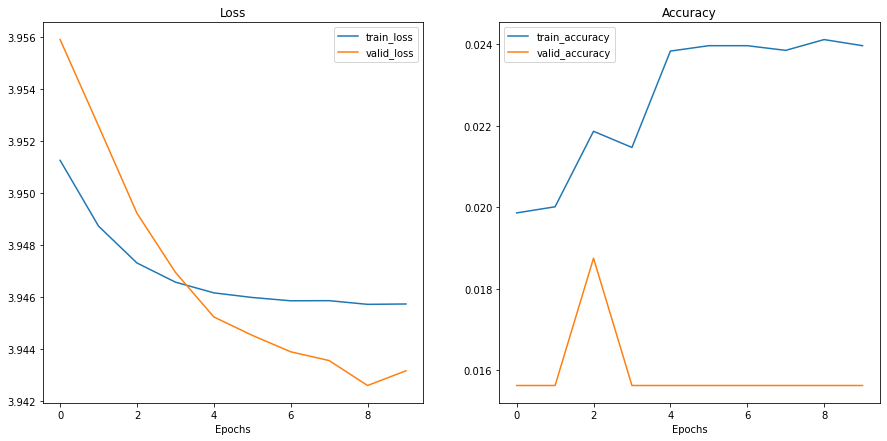

In [58]:
plot_loss_curves(model_0_results)

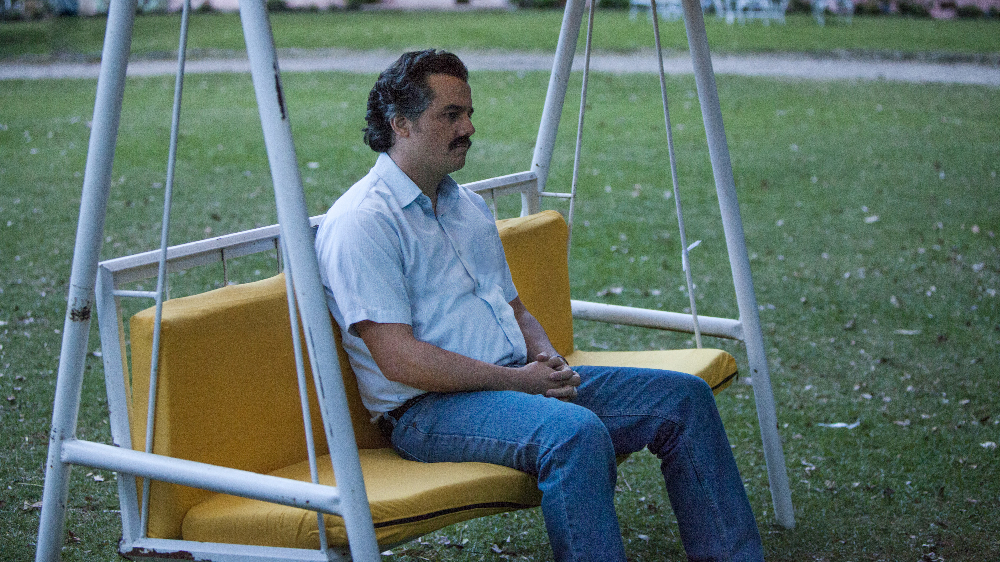

# Try transfer learning

In [11]:
weights = torchvision.models.EfficientNet_B1_Weights.DEFAULT
weights

EfficientNet_B1_Weights.IMAGENET1K_V2

In [12]:
auto_transforms = weights.transforms()
auto_transforms

ImageClassification(
    crop_size=[240]
    resize_size=[255]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

In [13]:
train_data = datasets.ImageFolder(root=train_dir,
                                  transform=auto_transforms,
                                  target_transform=None)

valid_data = datasets.ImageFolder(root=valid_dir,
                                  transform=auto_transforms)

test_data = datasets.ImageFolder(root=test_dir,
                                  transform=auto_transforms)

In [14]:
train_data

Dataset ImageFolder
    Number of datapoints: 7518
    Root location: train
    StandardTransform
Transform: ImageClassification(
               crop_size=[240]
               resize_size=[255]
               mean=[0.485, 0.456, 0.406]
               std=[0.229, 0.224, 0.225]
               interpolation=InterpolationMode.BILINEAR
           )

In [15]:
train_dl = DataLoader(dataset=train_data,
                     batch_size=64,
                     shuffle=True)

valid_dl = DataLoader(dataset=valid_data,
                     batch_size=64,
                     shuffle=False)

test_dl = DataLoader(dataset=test_data,
                     batch_size=64,
                     shuffle=False)

In [17]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model_1 = torchvision.models.efficientnet_b1(weights=weights).to(device)

In [18]:
summary(model_1, input_size=[32, 3, 224, 224], col_names = ["input_size", "output_size", "num_params", "trainable"])

Layer (type:depth-idx)                                  Input Shape               Output Shape              Param #                   Trainable
EfficientNet                                            [32, 3, 224, 224]         [32, 1000]                --                        True
├─Sequential: 1-1                                       [32, 3, 224, 224]         [32, 1280, 7, 7]          --                        True
│    └─Conv2dNormActivation: 2-1                        [32, 3, 224, 224]         [32, 32, 112, 112]        --                        True
│    │    └─Conv2d: 3-1                                 [32, 3, 224, 224]         [32, 32, 112, 112]        864                       True
│    │    └─BatchNorm2d: 3-2                            [32, 32, 112, 112]        [32, 32, 112, 112]        64                        True
│    │    └─SiLU: 3-3                                   [32, 32, 112, 112]        [32, 32, 112, 112]        --                        --
│    └─Sequential: 2-2  

In [19]:
torch.manual_seed(42)
torch.cuda.manual_seed(42)

output_shape = len(train_data.classes)

model_1.classifier = nn.Sequential(
    nn.Dropout(0.2),
    nn.Linear(in_features=1280, out_features=output_shape, bias=True)
).to(device)

In [25]:
torch.manual_seed(42) 
torch.cuda.manual_seed(42)

NUM_EPOCHS = 5

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params=model_1.parameters(), lr=0.001)
accuracy = Accuracy().to(device)

model_1_results = train(model_1, train_dl, valid_dl, optimizer, loss_fn, accuracy, epochs=NUM_EPOCHS)

Epoch: 1 | train_loss: 1.5270 | train_accuracy: 0.5790 | valid_loss: 0.3069 | valid_accuracy: 0.9281 | 
Epoch: 2 | train_loss: 0.3717 | train_accuracy: 0.8955 | valid_loss: 0.1809 | valid_accuracy: 0.9313 | 
Epoch: 3 | train_loss: 0.1966 | train_accuracy: 0.9451 | valid_loss: 0.1643 | valid_accuracy: 0.9500 | 
Epoch: 4 | train_loss: 0.1269 | train_accuracy: 0.9658 | valid_loss: 0.0710 | valid_accuracy: 0.9875 | 
Epoch: 5 | train_loss: 0.0942 | train_accuracy: 0.9730 | valid_loss: 0.0777 | valid_accuracy: 0.9750 | 
Epoch: 6 | train_loss: 0.0873 | train_accuracy: 0.9751 | valid_loss: 0.1236 | valid_accuracy: 0.9781 | 
Epoch: 7 | train_loss: 0.0633 | train_accuracy: 0.9819 | valid_loss: 0.0655 | valid_accuracy: 0.9781 | 
Epoch: 8 | train_loss: 0.0530 | train_accuracy: 0.9850 | valid_loss: 0.0785 | valid_accuracy: 0.9844 | 
Epoch: 9 | train_loss: 0.0493 | train_accuracy: 0.9845 | valid_loss: 0.1224 | valid_accuracy: 0.9313 | 
Epoch: 10 | train_loss: 0.0466 | train_accuracy: 0.9864 | valid_

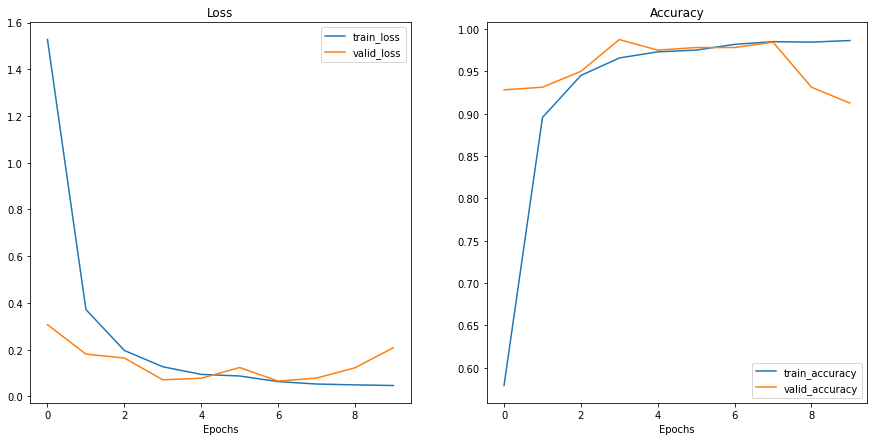

In [28]:
plot_loss_curves(model_1_results)

# With better transforms

In [38]:
aug_transforms = transforms.Compose([
    transforms.TrivialAugmentWide(20),
    weights.transforms()
])

In [39]:
train_data = datasets.ImageFolder(root=train_dir,
                                  transform=aug_transforms,
                                  target_transform=None)

valid_data = datasets.ImageFolder(root=valid_dir,
                                  transform=aug_transforms)

test_data = datasets.ImageFolder(root=test_dir,
                                  transform=aug_transforms)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


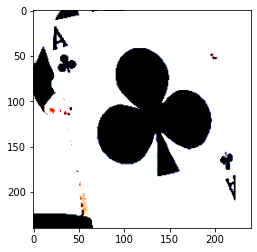

In [42]:
ex = train_data[0][0]
plt.imshow(ex.permute(1, 2, 0))

In [43]:
train_dl = DataLoader(dataset=train_data,
                     batch_size=64,
                     shuffle=True)

valid_dl = DataLoader(dataset=valid_data,
                     batch_size=64,
                     shuffle=False)

test_dl = DataLoader(dataset=test_data,
                     batch_size=64,
                     shuffle=False)

In [44]:
model_2 = torchvision.models.efficientnet_b1(weights=weights).to(device)

In [45]:
summary(model_2, input_size= (32, 3, 224, 224), col_names= ["input_size", "output_size", "num_params", "trainable"])

Layer (type:depth-idx)                                  Input Shape               Output Shape              Param #                   Trainable
EfficientNet                                            [32, 3, 224, 224]         [32, 1000]                --                        True
├─Sequential: 1-1                                       [32, 3, 224, 224]         [32, 1280, 7, 7]          --                        True
│    └─Conv2dNormActivation: 2-1                        [32, 3, 224, 224]         [32, 32, 112, 112]        --                        True
│    │    └─Conv2d: 3-1                                 [32, 3, 224, 224]         [32, 32, 112, 112]        864                       True
│    │    └─BatchNorm2d: 3-2                            [32, 32, 112, 112]        [32, 32, 112, 112]        64                        True
│    │    └─SiLU: 3-3                                   [32, 32, 112, 112]        [32, 32, 112, 112]        --                        --
│    └─Sequential: 2-2  

In [46]:
model_2.classifier = nn.Sequential(
    nn.Dropout(p=0.2, inplace=True),
    nn.Linear(1280, out_features=len(train_data.classes), bias=True)
).to(device)

In [47]:
torch.manual_seed(42) 
torch.cuda.manual_seed(42)

NUM_EPOCHS = 5

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params=model_2.parameters(), lr=0.001)
accuracy = Accuracy().to(device)

model_2_results = train(model_2, train_dl, valid_dl, optimizer, loss_fn, accuracy, epochs=NUM_EPOCHS)

Epoch: 1 | train_loss: 1.8372 | train_accuracy: 0.4671 | valid_loss: 0.8242 | valid_accuracy: 0.7656 | 
Epoch: 2 | train_loss: 0.6671 | train_accuracy: 0.8002 | valid_loss: 0.2849 | valid_accuracy: 0.9281 | 
Epoch: 3 | train_loss: 0.4505 | train_accuracy: 0.8617 | valid_loss: 0.2810 | valid_accuracy: 0.8750 | 
Epoch: 4 | train_loss: 0.3458 | train_accuracy: 0.8985 | valid_loss: 0.2187 | valid_accuracy: 0.9563 | 
Epoch: 5 | train_loss: 0.2995 | train_accuracy: 0.9148 | valid_loss: 0.1778 | valid_accuracy: 0.9625 | 


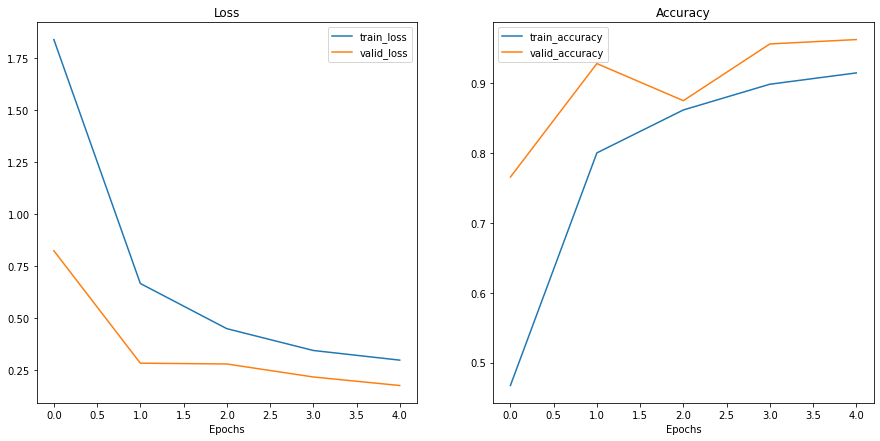

In [49]:
plot_loss_curves(model_2_results)

In [50]:
from typing import List, Tuple

from PIL import Image

def pred_and_plot_image(model: torch.nn.Module,
                        image_path: str, 
                        class_names: List[str],
                        image_size: Tuple[int, int] = (224, 224),
                        transform: torchvision.transforms = None,
                        device: torch.device=device):
    
    img = Image.open(image_path)

    if transform is not None:
        image_transform = transform
    else:
        image_transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]),
        ])

    model.to(device)

    model.eval()
    with torch.inference_mode():
        transformed_image = image_transform(img).unsqueeze(dim=0)

        target_image_pred = model(transformed_image.to(device))

    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)

    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)

    plt.figure()
    plt.imshow(img)
    plt.title(f"Pred: {class_names[target_image_pred_label]} | Prob: {target_image_pred_probs.max():.3f}")
    plt.axis(False);

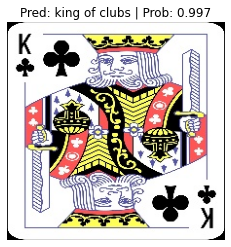

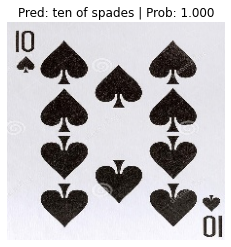

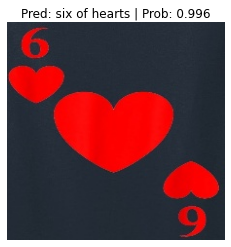

In [53]:
# Get a random list of image paths from test set
import random
num_images_to_plot = 3
test_image_path_list = list(Path(test_dir).glob("*/*.jpg")) # get list all image paths from test data 
test_image_path_sample = random.sample(population=test_image_path_list, # go through all of the test image paths
                                       k=num_images_to_plot) # randomly select 'k' image paths to pred and plot

# Make predictions on and plot the images
for image_path in test_image_path_sample:
    pred_and_plot_image(model=model_2, 
                        image_path=image_path,
                        class_names=class_names,
                        # transform=weights.transforms(), # optionally pass in a specified transform from our pretrained model weights
                        image_size=(224, 224))